Final Capstone Project with Collisons and accident severity - Data set
This notebook will be used mainly for Capstone Project

# Loading Required Libraries and packages

In [1]:
import pandas as pd
import numpy as np
import datetime
print("Hello Capstone Project Course!")

Hello Capstone Project Course!


In [2]:
import matplotlib.pyplot as plt   
from IPython.display import Image  
import seaborn as sns
from IPython.display import HTML, display
import tabulate
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier 
from sklearn.tree import export_graphviz
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import LabelEncoder
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression

## Defining any functions needed

In [3]:
def findDay(date): 
    dayOfWeek = datetime.datetime.strptime(date, '%d %m %Y').weekday() 
    return (calendar.day_name[dayOfWeek])

# Reading Data Set & dropping Features not required

In [6]:
#Reading Data from the CSV file
df=pd.read_csv("https://s3.us.cloud-object-storage.appdomain.cloud/cf-courses-data/CognitiveClass/DP0701EN/version-2/Data-Collisions.csv",dtype=None)
#Drop features which are not required
drop_features=['INCKEY','COLDETKEY','REPORTNO','STATUS','EXCEPTRSNCODE','EXCEPTRSNDESC','SDOT_COLCODE','SDOT_COLDESC','SDOTCOLNUM','ST_COLCODE','ST_COLDESC','SEGLANEKEY',
              'CROSSWALKKEY','HITPARKEDCAR','SEVERITYCODE.1','INCDATE','INATTENTIONIND','UNDERINFL','PEDROWNOTGRNT','SPEEDING','INTKEY','JUNCTIONTYPE','ROADCOND','LIGHTCOND']
df=df.drop(columns=drop_features,axis=1)

## Data Preprocessing & Formatting

In [8]:
# Dropping the rows where Null Values are given
df.dropna(subset=['WEATHER','X','Y','SEVERITYCODE'], inplace=True)
df.shape

(184414, 14)

In [12]:
# Restrict the data to Years 2020, 2019
df.astype({'INCDTTM': 'str'}).dtypes
df_new = df[df['INCDTTM'].str.contains("2020|2019")]
df_new.shape

(9896, 14)

In [13]:
#Splitting the time stamp and adding Date, Time and Weekday features
df_new['Date'] = pd.to_datetime(df_new['INCDTTM']).dt.date
df_new['Time'] = pd.to_datetime(df_new['INCDTTM']).dt.time
df_new['day-of-week'] = pd.to_datetime(df_new['INCDTTM']).dt.weekday_name

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See th

In [10]:
df_new.head()

,SEVERITYCODE,X,Y,OBJECTID,ADDRTYPE,LOCATION,SEVERITYDESC,COLLISIONTYPE,PERSONCOUNT,PEDCOUNT,PEDCYLCOUNT,VEHCOUNT,INCDTTM,WEATHER
5,1,-122.387598,47.690575,6,Intersection,24TH AVE NW AND NW 85TH ST,Property Damage Only Collision,Angles,2,0,0,2,4/20/2019 5:42:00 PM,Clear
7,2,-122.320780,47.614076,9,Intersection,BROADWAY AND E PIKE ST,Injury Collision,Cycles,3,0,1,1,4/15/2020 5:47:00 PM,Clear
18,2,-122.328270,47.571420,24,Block,S SPOKANE SR ST BETWEEN 4TH AVE S AND 5TH AVE S,Injury Collision,Rear Ended,4,0,0,3,4/17/2020 2:44:00 PM,Clear
25,2,-122.312857,47.599218,34,Block,S JACKSON ST BETWEEN 14TH AVE S AND 16TH AVE S,Injury Collision,Cycles,2,0,1,1,4/25/2019 9:40:00 AM,Clear
35,1,-122.318741,47.676567,44,Block,NE 66TH ST BETWEEN 8TH AVE NE AND ROOSEVELT WA...,Property Damage Only Collision,Parked Car,2,0,0,2,4/27/2019 1:26:00 PM,Raining


In [14]:
df_new['SEVERITYCODE'].value_counts()

1    6556
2    3340
Name: SEVERITYCODE, dtype: int64

In [22]:
df_new.groupby(['WEATHER'])['SEVERITYCODE'].value_counts(normalize=True)

WEATHER                   SEVERITYCODE
Blowing Sand/Dirt         1               0.916667
                          2               0.083333
Clear                     1               0.652045
                          2               0.347955
Fog/Smog/Smoke            1               0.692308
                          2               0.307692
Other                     1               0.754717
                          2               0.245283
Overcast                  1               0.662683
                          2               0.337317
Partly Cloudy             2               0.600000
                          1               0.400000
Raining                   1               0.651729
                          2               0.348271
Severe Crosswind          1               0.500000
                          2               0.500000
Sleet/Hail/Freezing Rain  1               0.666667
                          2               0.333333
Snowing                   1               0

In [23]:
# One hot encoding of weather and create feature for modeling
Feature = df_new[['SEVERITYCODE']]
Feature = pd.concat([Feature,pd.get_dummies(df_new['WEATHER'])], axis=1)
Feature.drop(['Unknown'], axis = 1,inplace=True)
Feature.head()

,SEVERITYCODE,Blowing Sand/Dirt,Clear,Fog/Smog/Smoke,Other,Overcast,Partly Cloudy,Raining,Severe Crosswind,Sleet/Hail/Freezing Rain,Snowing
5,1,0,1,0,0,0,0,0,0,0,0
7,2,0,1,0,0,0,0,0,0,0,0
18,2,0,1,0,0,0,0,0,0,0,0
25,2,0,1,0,0,0,0,0,0,0,0
35,1,0,0,0,0,0,0,1,0,0,0


## Feature Selection

In [24]:
from sklearn import preprocessing
X = Feature
X[0:5]
y = df_new['SEVERITYCODE'].values
y[0:5]
X = preprocessing.StandardScaler().fit(X).transform(X)
X[0:5]

/opt/conda/envs/Python36/lib/python3.6/site-packages/sklearn/preprocessing/data.py:645: DataConversionWarning: Data with input dtype uint8, int64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:6: DataConversionWarning: Data with input dtype uint8, int64 were all converted to float64 by StandardScaler.


array([[-0.71376256, -0.0348437 ,  0.73810687, -0.03626831, -0.07337941,
        -0.4236737 , -0.02248355, -0.4329261 , -0.01421769, -0.02463074,
        -0.10001021],
       [ 1.40102614, -0.0348437 ,  0.73810687, -0.03626831, -0.07337941,
        -0.4236737 , -0.02248355, -0.4329261 , -0.01421769, -0.02463074,
        -0.10001021],
       [ 1.40102614, -0.0348437 ,  0.73810687, -0.03626831, -0.07337941,
        -0.4236737 , -0.02248355, -0.4329261 , -0.01421769, -0.02463074,
        -0.10001021],
       [ 1.40102614, -0.0348437 ,  0.73810687, -0.03626831, -0.07337941,
        -0.4236737 , -0.02248355, -0.4329261 , -0.01421769, -0.02463074,
        -0.10001021],
       [-0.71376256, -0.0348437 , -1.35481736, -0.03626831, -0.07337941,
        -0.4236737 , -0.02248355,  2.30986306, -0.01421769, -0.02463074,
        -0.10001021]])

## Model Building - KNN
Split data train and Test and find best K

In [25]:
# We split the X into train and test to find the best k
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=4)
print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_test.shape,  y_test.shape)

Train set: (7422, 11) (7422,)
Test set: (2474, 11) (2474,)


In [28]:
# Modeling
from sklearn.neighbors import KNeighborsClassifier
k = 3
#Train Model and Predict  
kNN_model = KNeighborsClassifier(n_neighbors=k).fit(X_train,y_train)
kNN_model
# Best k
Ks=15
mean_acc=np.zeros((Ks-1))
std_acc=np.zeros((Ks-1))
ConfustionMx=[];
for n in range(1,Ks):
    
    #Train Model and Predict  
    kNN_model = KNeighborsClassifier(n_neighbors=n).fit(X_train,y_train)
    yhat = kNN_model.predict(X_test)
    
    
    mean_acc[n-1]=np.mean(yhat==y_test);
    
    std_acc[n-1]=np.std(yhat==y_test)/np.sqrt(yhat.shape[0])
mean_acc

array([0.99878739, 0.99878739, 0.99878739, 0.99838319, 0.9995958 ,
       0.99919159, 0.99919159, 0.99919159, 0.99919159, 0.99919159,
       0.9995958 , 0.9995958 , 0.9995958 , 0.9995958 ])

Minimum error:- 0.0004042037186742118 at K = 4


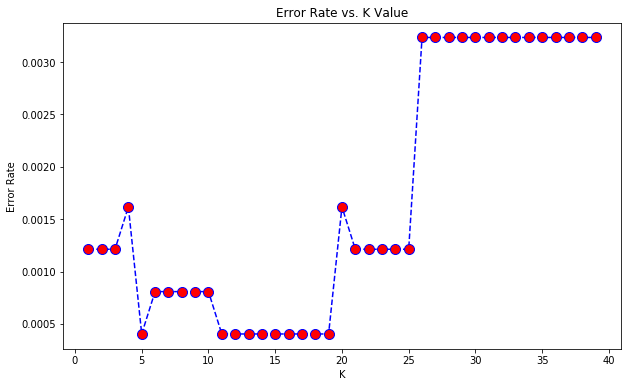

In [30]:
# Finding Optimum K
error_rate = []
for i in range(1,40):
 knn = KNeighborsClassifier(n_neighbors=i)
 knn.fit(X_train,y_train)
 pred_i = knn.predict(X_test)
 error_rate.append(np.mean(pred_i != y_test))

plt.figure(figsize=(10,6))
plt.plot(range(1,40),error_rate,color='blue', linestyle='dashed', 
         marker='o',markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')
print("Minimum error:-",min(error_rate),"at K =",error_rate.index(min(error_rate)))

In [31]:
# Building the model again, using k=3
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import jaccard_similarity_score
from sklearn.metrics import f1_score
from sklearn.metrics import log_loss
k = 3
#Train Model and Predict  
kNN_model = KNeighborsClassifier(n_neighbors=k).fit(X_train,y_train)
kNN_model
KNN_yhat = kNN_model.predict(X_test)
print("KNN Jaccard index: %.5f" % jaccard_similarity_score(y_test, KNN_yhat))
print("KNN F1-score: %.5f" % f1_score(y_test, KNN_yhat, average='weighted') )

KNN Jaccard index: 0.99879
KNN F1-score: 0.99879


## Decision Tree

In [33]:
from sklearn.tree import DecisionTreeClassifier
DT_model = DecisionTreeClassifier(criterion="entropy", max_depth = 3)
DT_model.fit(X_train,y_train)
DT_model
DT_yhat = DT_model.predict(X_test)
DT_yhat
print("DT Jaccard index: %.5f" % jaccard_similarity_score(y_test, DT_yhat))
print("DT F1-score: %.5f" % f1_score(y_test, DT_yhat, average='weighted') )

DT Jaccard index: 1.00000
DT F1-score: 1.00000


## Suport Vector Machine

In [34]:
from sklearn import svm
SVM_model = svm.SVC()
SVM_model.fit(X_train, y_train)
svm_yhat = SVM_model.predict(X_test)
svm_yhat
print("SVM Jaccard index: %.5f" % jaccard_similarity_score(y_test, svm_yhat))
print("SVM F1-score: %.5f" % f1_score(y_test, svm_yhat, average='weighted') )

SVM Jaccard index: 0.99879
SVM F1-score: 0.99879


/opt/conda/envs/Python36/lib/python3.6/site-packages/sklearn/svm/base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


## Logistic Regression

In [61]:
from sklearn.linear_model import LogisticRegression
LR_model = LogisticRegression(C=0.01).fit(X_train,y_train)
LR_model
LR_yhat = LR_model.predict(X_test)
LR_yhat_prob = LR_model.predict_proba(X_test)
LR_yhat
print("LR Jaccard index: %.2f" % jaccard_similarity_score(y_test, LR_yhat))
print("LR F1-score: %.5f" % f1_score(y_test, LR_yhat, average='weighted') )
print("LR LogLoss: %.5f" % log_loss(y_test, LR_yhat_prob))

LR Jaccard index: 1.00
LR F1-score: 1.00000
LR LogLoss: 0.04323


/opt/conda/envs/Python36/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


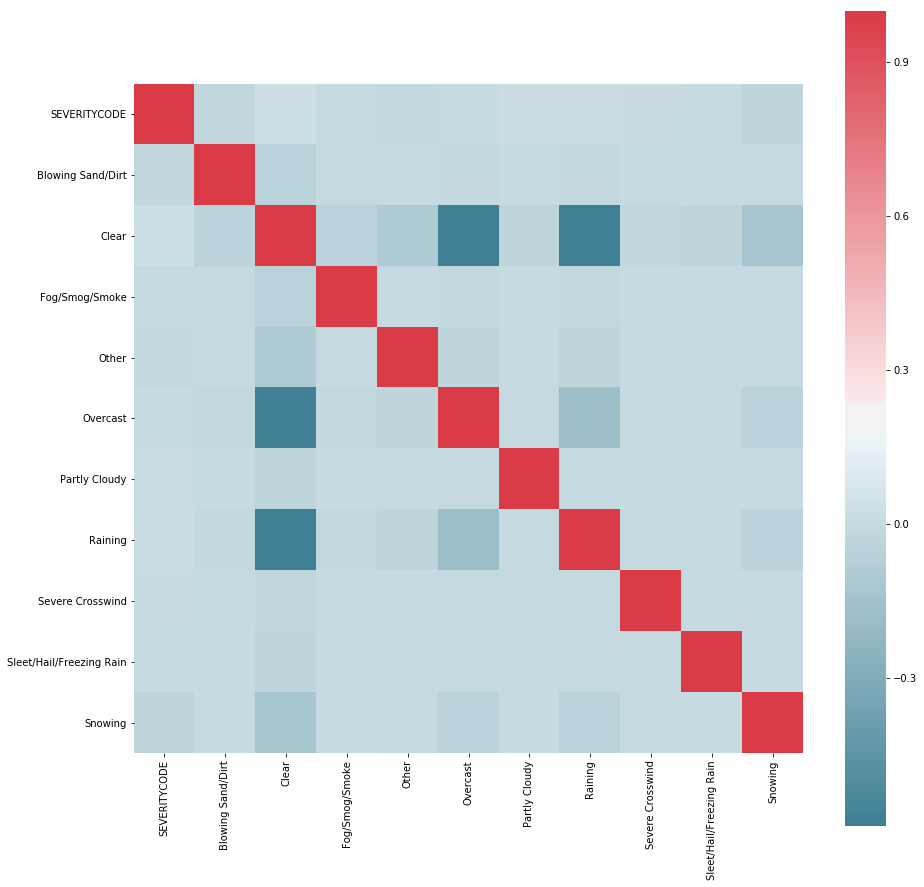

In [66]:
#correlation matrix
f, ax = plt.subplots(figsize=(15, 15))
corr = Feature.corr()
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool), cmap=sns.diverging_palette(220, 10, as_cmap=True),
            square=True, ax=ax)
plt.show()

## Summary

In [69]:
| Algorithm          | Jaccard    | F1-score    | LogLoss    |
|--------------------|------------|-------------|------------|
| KNN                | 0.99838    | 0.99838     | NA         |
| Decision Tree      | 1.00000    | 1.00000     | NA         |
| SVM                | 0.99797    | 0.99798     | NA         |
| LogisticRegression | 1.00000    | 1.00000     | 0.04323    |

SyntaxError: invalid syntax (<ipython-input-69-cbf0dd16d471>, line 1)

## Interactive Visual analysis to locate high accidents location

In [35]:
!conda install -c conda-forge folium=0.5.0 --yes
import folium
from folium import plugins

print('Folium installed and imported!')

Solving environment: done

## Package Plan ##

  environment location: /opt/conda/envs/Python36

  added / updated specs: 
    - folium=0.5.0


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    python_abi-3.6             |          1_cp36m           4 KB  conda-forge
    branca-0.4.1               |             py_0          26 KB  conda-forge
    ca-certificates-2020.6.20  |       hecda079_0         145 KB  conda-forge
    openssl-1.1.1g             |       h516909a_1         2.1 MB  conda-forge
    altair-4.1.0               |             py_1         614 KB  conda-forge
    vincent-0.4.4              |             py_1          28 KB  conda-forge
    certifi-2020.6.20          |   py36h9f0ad1d_0         151 KB  conda-forge
    folium-0.5.0               |             py_0          45 KB  conda-forge
    ------------------------------------------------------------
                       

In [36]:
# define the map centered around Seattle with a High zoom level
seattle_map = folium.Map(location=[47.6062, -122.3321], zoom_start=12)
# Markers for The Accidents on Seattle Map
# instantiate a feature group for the accidents in the dataframe
accidents = plugins.MarkerCluster().add_to(seattle_map)
# loop through the accidents and add each to the accident feature group
for lat, lng, label, in zip(df_new.Y, df_new.X, df_new.SEVERITYDESC):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup=label,
    ).add_to(accidents)
# add accidents to map
seattle_map.add_child(accidents)